# Segmentasi Pelanggan (Bursa Sajadah)
   

## I. About : 

Pemasaran berperan penting bagi perusahaan dalam menghadapi persaingan dengan perusahaan sejenis.Memahami kebutuhan dan karakteristik setiap pelanggan menjadi tujuan utama perusahaan dalam beroperasi, perubahan kebutuhan pelanggan bersifat dinamis yang mengakibatkan mendorong terjadinya perubahan dalam strategi pemasaran.

Final Project ini akan dilakukan segmentasi pelanggan dari dataset Bursa Sajadah, yang merupakan toko pusat perlengkapan muslim dan oleh - oleh haji dan umroh. Toko yang berdiri sejak tahun 1998 ini memiliki beberapa cabang diberbagai kota serta ditambah dengan Bursa Sajadah Online. RFM adalah analisis yang digunakan untuk membantu membedakan object yang berpengaruh terhadap data dengan membutuhkan tiga variable, yaitu interval satu transaksi, frekuensi, dan jumlah uang.

##  II. Case Study:

### Analisa :  

* Distribusi member dan non member dengan variabel-variabel yang tersedia
* Cabang  yang paling banyak menghasilkan revenue
* Produk yang paling laris dan hubungan dengan waktu atau musim-musim tertentu

### Strategi Marketing : 

* Segmentasi dari customer member dan non member
* Strategi campaign dari setiap segment yang direkomendasikan 

## III. About Dataset 

Dataset terdiri dari dua data yaitu data transaksi dan data customer. 

### Data glossary : 

Data transaksi :

* Outlet          : Cabang Bursa Sajadah
* Date            : Tanggal transaksi
* Time            : Waktu transaksi
* Gross Sales     : Harga sebelum diskon
* Discount        : potongan harga
* Refunds         : pengembalian barang
* Net Sales       : Harga setelah diskon
* Total Collected : Total belanja
* Items           : Barang yang dibeli
* Event type      : Tipe transaksi
* Payment method  : metode pembayaran
 

Data Customer : 
    
* Sex : Jenis Kelamin Pelanggan
* City : Kota/Kab Pelanggan
* State : Provinsi Pelanggan
* Zip Code : Kode Pos Pelanggan
* Customer Since : Keterangan waktu terdaftar sebagai pelanggan
* Last Visit : Keterangan waktu terakhir mengunjungi outlet
* Total # of orders : Banyaknya pesanan yg dibeli
* Amount This Month : Jumlah uang yg berasal dari pelanggan di bulan tersebut
* Amount This Year : Jumlah uang yg berasal dari pelanggan di tahun tersebut
* Amount Lifetime : Jumlah uang yg berasal dari pelanggan secara keseluruhan
* Amount Average : Rerata jumlah uang yg berasal dari pelanggan berdasarkan (Amount Lifetime dibagi Total #of orders)
* Member Since : Keterangan waktu pelanggan terdaftar sebagai member
* Current Point Balance : Point yg diterima pelanggan (member)
* Reward Redeemed : Reward adalah point yg dicairkan oleh pelanggan
* Member Spending : Jumlah uang yg berasal dari pelanggan (member)

# 1. Loading Libraries

In [1]:
!pip install plotly
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import datetime as dt

!pip install WordCloud
from wordcloud import WordCloud, STOPWORDS
import plotly.offline as pyoff
import plotly.graph_objs as go
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings("ignore")

# 2.Getting Dataset

In [2]:
import pandas as pd
customer= pd.read_csv("Customer_hashed.csv")
transaction= pd.read_csv("transaction_complete.csv")

In [3]:
customer.head()

,Unnamed: 0,Birthday,Sex,City,State,Zip Code,Customer Since,Last Visit,Total # of orders,Amount This Month,Amount This Year,Amount Lifetime,Amount Average,Member Since,Current Point Balance,Reward Redeemed,Member Spending,id_len,ids
0,0,12-12-1979,female,Kab Bekasi,Jawa Barat,NaN,03-12-2018,03-12-2018,1,NaN,NaN,783250.0,783250.0,03-12-2018,7.0,NaN,783250.0,4,n71m
1,7,NaN,NaN,NaN,NaN,NaN,04-12-2018,21-04-2020,4,NaN,379850.0,1597850.0,399462.5,21-04-2020,2.0,NaN,113000.0,4,ntf6
2,11,NaN,NaN,NaN,NaN,NaN,19-12-2018,19-05-2020,2,NaN,2287400.0,2967400.0,1483700.0,19-05-2020,23.0,NaN,2287400.0,4,drou
3,13,NaN,NaN,NaN,NaN,NaN,22-12-2018,09-01-2019,2,NaN,NaN,1134310.0,567155.0,09-01-2019,3.0,NaN,285750.0,4,h9pu
4,26,NaN,NaN,NaN,NaN,NaN,08-05-2019,19-05-2019,1,NaN,NaN,663460.0,663460.0,19-05-2019,7.0,NaN,663460.0,4,vz6t


In [4]:
customer.drop(['Unnamed: 0','id_len','Zip Code','Current Point Balance','Reward Redeemed'], axis=1, inplace=True)

In [5]:
transaction= transaction.rename(columns={'Customer Phone' : 'ids'})

In [6]:
transaction.drop(['Unnamed: 0','Unnamed: 0.1','Gratuity','Tax','id_len'], axis=1, inplace=True)

In [7]:
data= pd.merge(customer,transaction,on='ids')
data

,Birthday,Sex,City,State,Customer Since,Last Visit,Total # of orders,Amount This Month,Amount This Year,Amount Lifetime,...,Gross Sales,Discounts,Refunds,Net Sales,Total Collected,Other Note (Optional),Receipt Number,Items,Event Type,Payment Method
0,12-12-1979,female,Kab Bekasi,Jawa Barat,03-12-2018,03-12-2018,1,NaN,NaN,783250.0,...,4493000.0,488000.0,0.0,4005000.0,4005000.0,11,15D182P,"Velteksa Small Polos x 85, Velteksa Normal Cla...",Payment,BCA
1,07-04-1983,female,Bogor,Jawa Barat,25-09-2020,25-09-2020,1,NaN,4005000.0,4005000.0,...,4493000.0,488000.0,0.0,4005000.0,4005000.0,11,15D182P,"Velteksa Small Polos x 85, Velteksa Normal Cla...",Payment,BCA
2,NaN,NaN,NaN,NaN,04-12-2018,21-04-2020,4,NaN,379850.0,1597850.0,...,162000.0,32400.0,0.0,129600.0,129600.0,NaN,2ZIJ5ZI,Air Mineral Bambu 120 Ml x 6,Payment,Cash
3,NaN,NaN,NaN,NaN,04-12-2018,21-04-2020,4,NaN,379850.0,1597850.0,...,180000.0,42750.0,0.0,137250.0,137250.0,NaN,2ZIJ6KG,"Pistachio Ons, Dus Paket Kurma 250 Gr x 20, Sa...",Payment,Cash
4,NaN,NaN,NaN,NaN,04-12-2018,21-04-2020,4,NaN,379850.0,1597850.0,...,8000.0,1600.0,0.0,6400.0,6400.0,NaN,2ZIJ80D,Today Croissant,Payment,Cash
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68795,NaN,NaN,NaN,NaN,16-11-2020,NaN,0,NaN,NaN,NaN,...,325000.0,0.0,0.0,325000.0,325000.0,12,15D18E1,"Parfum Alharamain Madinah 15ml, Sykava Koko Pe...",Payment,BCA
68796,NaN,NaN,NaN,NaN,16-11-2020,NaN,0,NaN,NaN,NaN,...,15000.0,0.0,0.0,15000.0,15000.0,NaN,OTNUEH,Counter Cincin,Payment,Cash
68797,NaN,NaN,NaN,NaN,16-11-2020,NaN,0,NaN,NaN,NaN,...,54400.0,27400.0,0.0,27000.0,27000.0,NaN,OTNUEI,"Sukary Dates Ons x 3, Kresek Bursa 0.4 UK 35x50*",Payment,Cash
68798,NaN,NaN,NaN,NaN,16-11-2020,NaN,0,NaN,NaN,NaN,...,460400.0,115400.0,0.0,345000.0,345000.0,NaN,GJZ2UA,"Ajwa Dates 1000 Gr, Kresek Bursa 0.4 UK 35x50*",Payment,Cash


In [8]:
data.describe()

,Total # of orders,Amount This Month,Amount This Year,Amount Lifetime,Amount Average,Member Spending,Gross Sales,Discounts,Refunds,Net Sales,Total Collected
count,68800.000000,8.381000e+03,6.587200e+04,6.645200e+04,6.644700e+04,2.726500e+04,6.880000e+04,6.880000e+04,6.880000e+04,6.880000e+04,6.880000e+04
mean,738.370247,2.288416e+05,9.948287e+07,1.199692e+08,4.421904e+05,6.271285e+06,4.591411e+05,5.576244e+04,5.235027e+03,3.981436e+05,3.981436e+05
std,1312.151208,8.727872e+05,1.695839e+08,1.987129e+08,7.072461e+05,1.195012e+07,1.086995e+06,2.323314e+05,1.011988e+05,9.116867e+05,9.116867e+05
min,0.000000,-2.420000e+05,-3.000000e+05,-5.850000e+04,-5.850000e+04,1.000000e+02,0.000000e+00,-1.000500e+07,0.000000e+00,-9.335000e+06,-9.335000e+06
25%,2.000000,-2.420000e+05,4.549100e+05,6.730450e+05,1.494652e+05,1.268050e+06,8.097500e+04,0.000000e+00,0.000000e+00,7.250000e+04,7.250000e+04
50%,6.000000,1.500000e+04,1.965580e+06,3.278980e+06,2.187500e+05,2.886545e+06,1.994000e+05,1.200000e+04,0.000000e+00,1.770000e+05,1.770000e+05
75%,1169.000000,3.780000e+05,2.437722e+08,2.951969e+08,5.058359e+05,6.620580e+06,4.650000e+05,5.190000e+04,0.000000e+00,4.132000e+05,4.132000e+05
max,3955.000000,1.197200e+07,5.384178e+08,5.961905e+08,5.404113e+07,1.661197e+08,6.000000e+07,3.000000e+07,1.934000e+07,5.000000e+07,5.000000e+07


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68800 entries, 0 to 68799
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Birthday               16331 non-null  object 
 1   Sex                    21442 non-null  object 
 2   City                   13386 non-null  object 
 3   State                  9919 non-null   object 
 4   Customer Since         68800 non-null  object 
 5   Last Visit             66498 non-null  object 
 6   Total # of orders      68800 non-null  int64  
 7   Amount This Month      8381 non-null   float64
 8   Amount This Year       65872 non-null  float64
 9   Amount Lifetime        66452 non-null  float64
 10  Amount Average         66447 non-null  float64
 11  Member Since           27265 non-null  object 
 12  Member Spending        27265 non-null  float64
 13  ids                    68800 non-null  object 
 14  Outlet                 68800 non-null  object 
 15  Da

# 3. Data Understanding

### Initial Check 

1. How many customer member and customer non member
2. How many product per ids
3. What kind of the product
4. Time Bound Data
5. City distribution


In [10]:
data.shape

(68800, 27)

### 1. How many customer member  and non member

In [11]:
data["ids"].nunique()

25647

In [12]:
customer = data['Customer Since'].notnull().sum()
member = data['Member Since'].notnull().sum()
dict_customer = {'pelanggan': customer}
dict_member = {'pelanggan': member}
non_member = customer - member
dict_non_member = {'pelanggan': non_member}

In [13]:
pelanggan = pd.DataFrame({'customer':dict_customer,'non_member':dict_non_member, 'member':dict_member})
data_pelanggan = pelanggan.T
data_pelanggan

,pelanggan
customer,68800
non_member,41535
member,27265


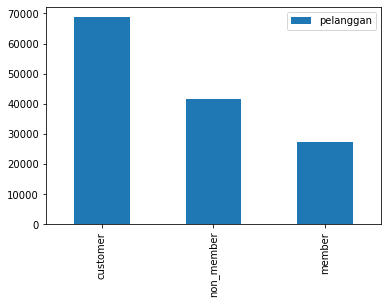

In [14]:
data_pelanggan.plot(kind='bar')

### 2. How many product per ids

In [15]:
data.groupby("ids", as_index=False)[["Total # of orders"]].count().head()

,ids,Total # of orders
0,005h,1
1,006ei,1
2,009j2,1
3,00boe,1
4,00dpl,3


### 3. What kind of the product

In [16]:
products_desc = '|'.join(data["Items"].unique())
products_desc

'Velteksa Small Polos x 85, Velteksa Normal Classic B x 6, Klin Care 50 Ml, Reg Member|Air Mineral Bambu 120 Ml x 6|Pistachio Ons, Dus Paket Kurma 250 Gr x 20, Sari Kurma SKV 180 Gr, Chocolate Stones 100 Gr, Raisin Chocolate btg|Today Croissant|Velteksa Small Polos, Ongkir, Madu Putih 300 Gr, Ongkir|Velteksa Normal Super Soft x 3|Sukary Dates Ons, Today Croissant|Velteksa Normal Spiegle Classic Busa|Madu Yaman Sumroh 300 gr|Wadimor Songket Melayu x 2, Ajwa Dates Ons x 5, Byz Caps Putih/Lusin, Pakistan Strimin Dasar Putih No.09 x 2, Soka Socking Antislip L Black, Atlas JNR, Wadimor Junior Rp x 2, Gamis Ikhwan Lgn Pjg GIPJ 25, Gamis Ikhwan GIPD 36, Celana Abi Coklat S, Celana Abi S Putih, Gamis Modif Putih GIPJ 34|NT Gunting|Minuman Kurma Jahe 150 ml|Kafiyah B x 2, Balado Chickpeas Ons x 5|Kafiyah B|Mada 8 Mili|Madu Assyfa 250 gr (btl) x 2, Sukary Dates Ons x 10|Palmfruit Tangkai (Tunis) 500 g x 2, Chickpeas 1000 Gr, Chickpeas Ons x 10, Golden Raisins Ons x 3|Aydin Genova Kaftan|Today Cr

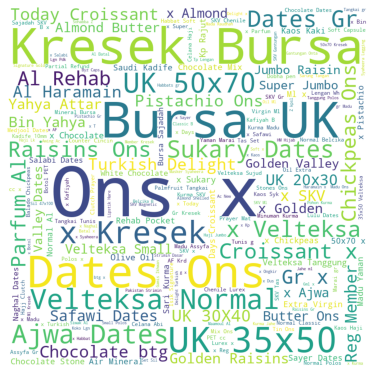

In [17]:
wcloud = WordCloud(width=800, height=800,background_color="white",stopwords=STOPWORDS,max_words=200 ).generate(products_desc)
plt.figure(figsize = (5,5), facecolor = None) 
plt.imshow(wcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show()

### 4. Time bound Data 

In [18]:
#timebound
import datetime as dt
from datetime import datetime as dt2
from datetime import timedelta as td
from datetime import time as tm
print(data["Date"].min())
print(data["Date"].max())
print("The data is from 1 year transaction")

2019-01-01
2020-11-30 00:00:00
The data is from 1 year transaction


### 5.Outlet distribution 

In [19]:
data.groupby('Outlet')['Total # of orders'].count().sort_values(ascending=False)/data['Total # of orders'].count()

Outlet
CITARUM         0.238968
BEKASI          0.160756
UJUNG BERUNG    0.108125
MTC             0.093576
BOGOR           0.088706
JAKARTA         0.085407
BSD             0.076919
INHOFTANK       0.059767
CIBUBUR         0.041250
SURABAYA        0.033212
MALANG          0.006410
CIREBON         0.003503
SERANG          0.003372
ONLINE          0.000029
Name: Total # of orders, dtype: float64

In [20]:
data["Outlet"].nunique()

14

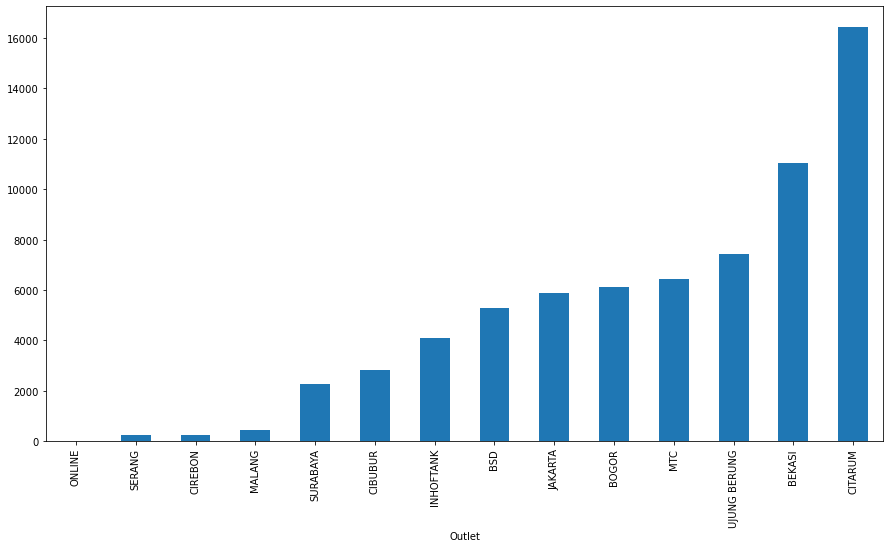

In [21]:
plt.figure(figsize=(15,8))
data.groupby('Outlet')['Total # of orders'].count().sort_values().plot(kind='bar')
plt.show()

The highest transaction amount belong to Outlet in Citarum and the lowest transaction amount in e-commerce(Online).

In [22]:
data.groupby('Outlet')["Items"].nunique().sort_values(ascending=False)

Outlet
CITARUM         12330
BEKASI           9653
UJUNG BERUNG     5543
JAKARTA          5317
BOGOR            4786
BSD              4741
MTC              4635
INHOFTANK        3394
CIBUBUR          2552
SURABAYA         2235
MALANG            432
CIREBON           235
SERANG            227
ONLINE              2
Name: Items, dtype: int64

In [23]:
data.Date= pd.to_datetime(data.Date)
data.Date= pd.DatetimeIndex(data.Date )
data['Weekdays'] = data.Date.dt.day_name()
data.groupby('Weekdays')['Total # of orders'].count().sort_values(ascending=False)/data['Total # of orders'].count()

Weekdays
Saturday     0.163445
Sunday       0.144157
Thursday     0.142834
Friday       0.142282
Wednesday    0.136250
Monday       0.135669
Tuesday      0.135363
Name: Total # of orders, dtype: float64

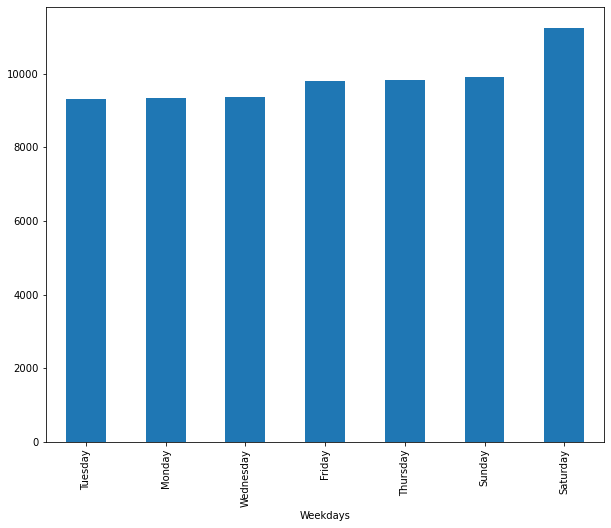

In [24]:
plt.figure(figsize=(10,8))
data.groupby('Weekdays')['Total # of orders'].count().sort_values().plot(kind='bar')
plt.show()

 Saturday is the highest number of transaction 

# 3. Exploratory Data Analysis 

 
1.  How many product sold every month
2.  How much each customer spend money every month
3.  New Customer every month
4.  Retention rate every month
5.  Interval of each transaction 

In [25]:
data['month-Year'] = data["Date"].apply(lambda x: 100*x.year + x.month)
data['month-Year'].unique()

array([202009, 202001, 202003, 202004, 202005, 202007, 202006, 202010,
       202011, 202002, 202008, 201901], dtype=int64)

In [26]:
#Citarum transaction
data_Citarum = data.loc[data["Outlet"]=="CITARUM"]
data_nCitarum = data.loc[data["Outlet"]!="CITARUM"]

Text(0.5, 1.0, 'Total Transaksi Per Bulan')

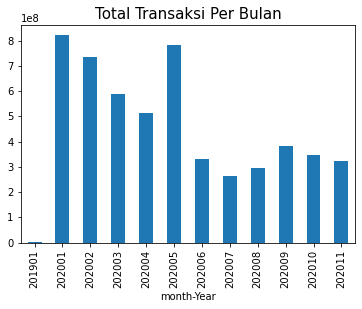

In [27]:
data_Citarum.groupby("month-Year")["Total Collected"].sum().plot(kind="bar")
plt.title("Total Transaksi Per Bulan",fontsize=15)

### 1. How many product sold every month

Text(0.5, 1.0, 'Number of Sold Product By Month')

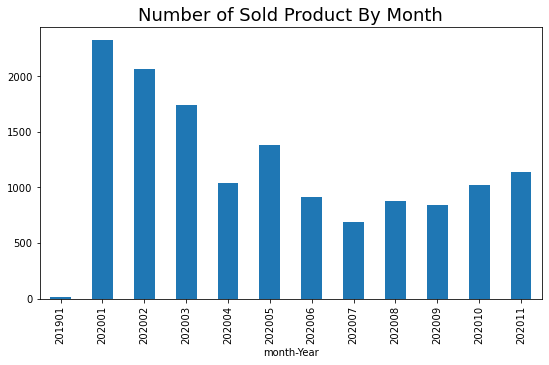

In [28]:
data_Citarum.groupby("month-Year")["Items"].nunique().plot(kind="bar",figsize=(9,5))
plt.title("Number of Sold Product By Month",fontsize=18)

Produk yang habis terjual tertinggi terjadi pada bulan Januari 2020

Text(0.5, 1.0, 'Percentage of sold product')

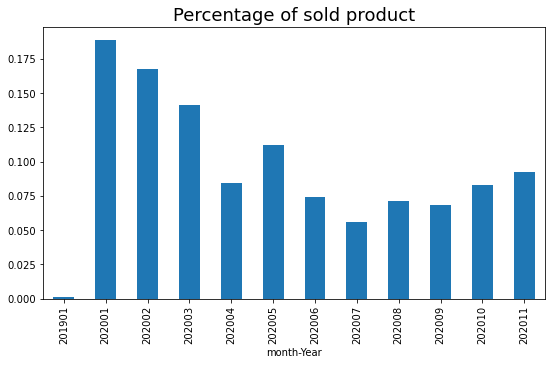

In [29]:
(data_Citarum.groupby("month-Year")["Items"].nunique()/data_Citarum["Items"].nunique()).plot(kind="bar",figsize=(9,5))

plt.title("Percentage of sold product",fontsize=18)

### 2. How much customer spend their money every month 

Text(0.5, 1.0, 'Number of Transaction By Month')

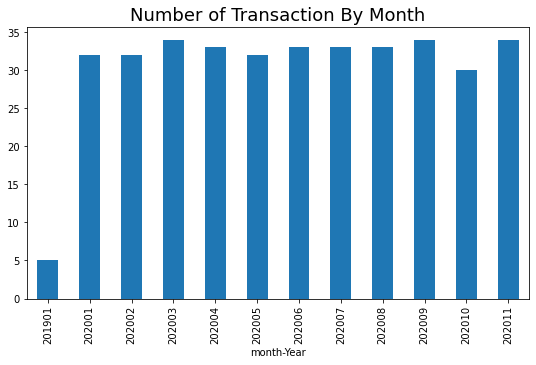

In [30]:
data_Citarum.groupby("month-Year",as_index=True)["Total # of orders"].nunique().plot(kind="bar",figsize=(9,5))
plt.title("Number of Transaction By Month",fontsize=18)

### 3. How many new customer every month 

In [31]:
data_Citarum_new = data_Citarum.groupby("ids").Date.min().reset_index()
data_Citarum_new.columns = ["ids","FirstPurchase"]
data_Citarum = pd.merge(data_Citarum, data_Citarum_new,on="ids")
data_Citarum.head()

,Birthday,Sex,City,State,Customer Since,Last Visit,Total # of orders,Amount This Month,Amount This Year,Amount Lifetime,...,Net Sales,Total Collected,Other Note (Optional),Receipt Number,Items,Event Type,Payment Method,Weekdays,month-Year,FirstPurchase
0,NaN,NaN,NaN,NaN,19-12-2018,19-05-2020,2,NaN,2287400.0,2967400.0,...,2287400.0,2287400.0,23,3BOM3U,"Wadimor Songket Melayu x 2, Ajwa Dates Ons x 5...",Payment,Mandiri,Tuesday,202005,2020-05-19
1,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,18800.0,18800.0,NaN,1O57FG,NT Gunting,Payment,Cash,Tuesday,202001,2020-01-21
2,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,10400.0,10400.0,NaN,3BOK79,Minuman Kurma Jahe 150 ml,Payment,Cash,Wednesday,202004,2020-01-21
3,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,288000.0,288000.0,25,3BOK7S,"Kafiyah B x 2, Balado Chickpeas Ons x 5",Payment,Mandiri,Thursday,202004,2020-01-21
4,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,6400.0,6400.0,NaN,3BOK9B,Today Croissant,Payment,Cash,Friday,202004,2020-01-21


In [32]:
data_Citarum["Class"] = "New"
data_Citarum.loc[data_Citarum["Date"]>data_Citarum["FirstPurchase"],"Class"] = "Existing"
data_Citarum.head()

,Birthday,Sex,City,State,Customer Since,Last Visit,Total # of orders,Amount This Month,Amount This Year,Amount Lifetime,...,Total Collected,Other Note (Optional),Receipt Number,Items,Event Type,Payment Method,Weekdays,month-Year,FirstPurchase,Class
0,NaN,NaN,NaN,NaN,19-12-2018,19-05-2020,2,NaN,2287400.0,2967400.0,...,2287400.0,23,3BOM3U,"Wadimor Songket Melayu x 2, Ajwa Dates Ons x 5...",Payment,Mandiri,Tuesday,202005,2020-05-19,New
1,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,18800.0,NaN,1O57FG,NT Gunting,Payment,Cash,Tuesday,202001,2020-01-21,New
2,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,10400.0,NaN,3BOK79,Minuman Kurma Jahe 150 ml,Payment,Cash,Wednesday,202004,2020-01-21,Existing
3,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,288000.0,25,3BOK7S,"Kafiyah B x 2, Balado Chickpeas Ons x 5",Payment,Mandiri,Thursday,202004,2020-01-21,Existing
4,NaN,NaN,NaN,NaN,11-05-2019,21-05-2020,10,NaN,1008150.0,6137400.0,...,6400.0,NaN,3BOK9B,Today Croissant,Payment,Cash,Friday,202004,2020-01-21,Existing


In [33]:
data_Citarum["Class"].unique()

array(['New', 'Existing'], dtype=object)

Text(0.5, 1.0, 'Number of New Customer Per Month')

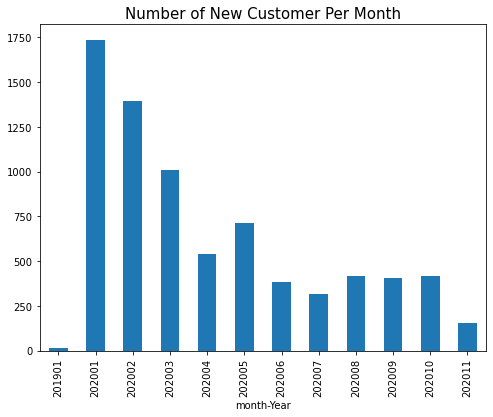

In [34]:
data_Citarum.loc[data_Citarum["Class"]=="New"].groupby("month-Year")["ids"].nunique().plot(kind="bar", figsize=(8,6))
plt.title("Number of New Customer Per Month", fontsize=15)

Bulan Januari 2020 

### 4. Retention Rate 

Text(0.5, 1.0, 'Retention Rate By Month')

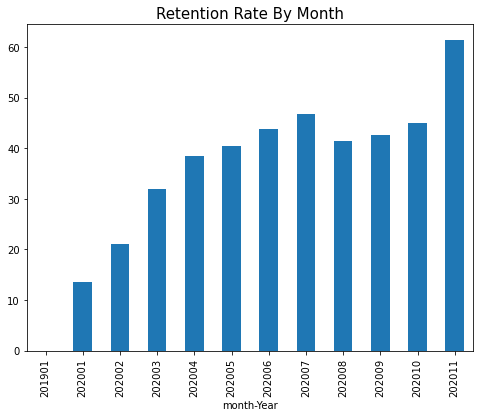

In [35]:
(data_Citarum.loc[data_Citarum["Class"]=="Existing"].groupby("month-Year")["ids"].nunique()/data_Citarum.groupby("month-Year")["ids"].nunique()*100).plot(kind="bar", figsize=(8,6))
plt.title("Retention Rate By Month", fontsize=15)

### 5. Interval of transaction 

In [36]:
data_Citarum_dist = data_Citarum.sort_values(by=["ids","Date"], axis=0, inplace=False)
data_Citarum_dist = data_Citarum_dist.drop_duplicates(subset="Items")

In [37]:
ids = []
distc = []
t = ""

for index, row in data_Citarum_dist.iterrows():
    if row["ids"] in ids:
        distc.append(round((row["Date"] - t).total_seconds()/86400,2))
        t = row["Date"]
    else:
        ids.append(row["ids"])
        t = row["Date"]
        distc.append(0)

In [38]:
data_Citarum_dist["between_trans"] = distc
data_Citarum_avg_dist = data_Citarum_dist.groupby("ids").between_trans.median().reset_index()
data_Citarum_avg_dist.columns=["ids","avgDistance"]

In [39]:
data_Citarum_avg_dist.loc[data_Citarum_avg_dist["avgDistance"]>0]["avgDistance"].describe()

count    1483.000000
mean       29.768038
std        32.773254
min         0.500000
25%         6.500000
50%        16.000000
75%        43.000000
max       160.500000
Name: avgDistance, dtype: float64

In [40]:
plot_data = [
    go.Histogram(
        x=data_Citarum_avg_dist.loc[data_Citarum_avg_dist["avgDistance"]>0]["avgDistance"]
    )
]

plot_layout = go.Layout(
        title='Avg. Days Between Transaction'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

# 4. Evaluating model

## RFM Analysis 

* ### R – Recency – Keterkinian
    Recency adalah variabel untuk mengukur   nilai   pelanggan   berdasarkan rentang   waktu   (tanggal,   bulan,   tahun) transaksi  terakhir  pelanggan  sampai  saat ini. Semakin kecil rentang waktu maka nilai recency semakin besar.
    
    Keterkinian pembelian adalah alat penting untuk mengidentifikasi pelanggan yang telah membeli sesuatu baru-baru ini. Pelanggan yang membeli belum lama ini lebih cenderung bereaksi terhadap penawaran baru daripada pelanggan yang pembeliannya terjadi sejak lama. Ini adalah faktor yang paling penting dalam analisis RFM.

* ### F – Frequency – Frekuensi
    Frequencymerupakan    variabel    untuk mengukur   nilai   pelanggan   berdasarkan jumlah transaksi yang dilakukan pelanggan dalam    satu    periode.    Semakin    banyak jumlah transaksi yang dilakukan maka nilai f semakin besar.
    
    Frekuensi pembelian muncul setelah keterkinian. Jika pelanggan membeli lebih sering, kemungkinan respons positif lebih tinggi daripada pelanggan yang jarang membeli sesuatu.

* ### M – Monetary Value – Nilai Uang
    Monetarymerupakan     variabel     untuk mengukur   nilai   pelanggan   berdasarkan jumlah   besaran   uang   yang   dikeluarkan pelanggan  dalam  satu  periode.  Semakin banyak     jumlah     besaran     uang     yang dikeluarkan    pelanggan    maka    nilai    M semakin besar. 
    
    Omset pembelian atau nilai moneter mengacu pada semua pembelian yang dilakukan oleh pelanggan. Pelanggan yang menghabiskan lebih banyak uang untuk pembelian lebih cenderung menanggapi penawaran daripada pelanggan yang telah menghabiskan jumlah yang lebih kecil.

In [41]:
data_non_minus = data_Citarum.loc[data_Citarum["Total Collected"]>0]

In [42]:
data_non_minus_id = pd.DataFrame(data_non_minus["ids"].unique())
data_non_minus_id.columns = ["ids"]

In [43]:
data_max_purchase = data_non_minus.groupby("ids").Date.max().reset_index(name="LastPurchaseDate")

### Recency 

In [44]:
last_transaction = data_max_purchase["LastPurchaseDate"].max() 
data_max_purchase["Recency"] = ( last_transaction - data_max_purchase["LastPurchaseDate"])
data_max_purchase["Recency"] = [round(x.total_seconds()/86400,2) for x in data_max_purchase["Recency"]]
data_max_purchase.sort_values(by="LastPurchaseDate").head(10)

,ids,LastPurchaseDate,Recency
3420,gle5,2019-01-02,698.0
4874,nu0zs,2019-01-02,698.0
1795,8ljog,2019-01-03,697.0
2933,e7lk6,2019-01-04,696.0
5660,rizrx,2019-01-06,694.0
4966,o9qpj,2019-01-08,692.0
4609,mjjni,2019-01-09,691.0
1367,6eslj,2019-01-09,691.0
3113,f38fj,2019-01-09,691.0
5977,t0th,2019-01-10,690.0


In [45]:
rfm_df = pd.merge(data_non_minus_id, data_max_purchase, on="ids")
rfm_df.drop(["LastPurchaseDate"],axis=1, inplace=True)
rfm_df.head()

,ids,Recency
0,drou,195.0
1,gg8i,0.0
2,mglb,328.0
3,cc9e,152.0
4,jfup,230.0


In [46]:
plot_data = [
    go.Histogram(
        x=rfm_df['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Frequency 

In [47]:
data_freq = pd.DataFrame(data_non_minus.groupby("ids")["Items"].nunique().reset_index())
data_freq.columns = ["ids","Frequency"]
data_freq.head()

,ids,Frequency
0,005h,1
1,00dpl,3
2,00h4a,1
3,00kn,2
4,00r2,1


In [48]:
#merge dataset
rfm_df = pd.merge(rfm_df, data_freq, on="ids")
rfm_df.head()

,ids,Recency,Frequency
0,drou,195.0,1
1,gg8i,0.0,17
2,mglb,328.0,1
3,cc9e,152.0,16
4,jfup,230.0,1


In [49]:
plot_data = [
    go.Histogram(
        x=rfm_df['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Monetary 

In [50]:
data_mon = pd.DataFrame(data_non_minus.groupby("ids")["Total Collected"].sum().reset_index())
data_mon.columns = ["ids","Monetary"]
data_mon.head()

,ids,Monetary
0,005h,387000.0
1,00dpl,340000.0
2,00h4a,150000.0
3,00kn,2108150.0
4,00r2,500000.0


In [51]:
rfm_df = pd.merge(data_mon, rfm_df, on="ids")
rfm_df.head()

,ids,Monetary,Recency,Frequency
0,005h,387000.0,74.0,1
1,00dpl,340000.0,279.0,3
2,00h4a,150000.0,194.0,1
3,00kn,2108150.0,213.0,2
4,00r2,500000.0,217.0,1


In [52]:
plot_data = [
    go.Histogram(
        x=rfm_df['Monetary']
    )
]

plot_layout = go.Layout(
        title='Monetary'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Age(Days)

In [53]:
last_purchase = data_non_minus["Date"].max()
customer_since = data_non_minus.groupby("ids").Date.min().reset_index()
customer_since.columns = ["ids", "FirstPurchase"]
customer_since["Age(Days)"] = (last_purchase - customer_since["FirstPurchase"])
customer_since["Age(Days)"] = [round(x.total_seconds()/86400,2) for x in customer_since["Age(Days)"]]

In [54]:
#merge dataframe
rfm_df = pd.merge(rfm_df, customer_since, on="ids")

In [55]:
rfm_df.drop(["FirstPurchase"], axis=1, inplace=True)

In [56]:
plot_data = [
    go.Histogram(
        x=rfm_df['Age(Days)']
    )
]

plot_layout = go.Layout(
        title='Age(Days)'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

Chart diatas menunjukan distribusi umur customer. Kebanyakan customer berumur anatar 320 s.d 329 hari. Dari chart ini kita mendapat insight bahwa jumlah customer baru terus menurun, sehingga akan sangat penting menjaga customer yang ada untuk tetap aktif.

### Return(Days) 

In [57]:
rfm_df = pd.merge(rfm_df, data_Citarum_avg_dist, on="ids")
rfm_df.rename({"AvgDistance":"Return(Days)"})

,ids,Monetary,Recency,Frequency,Age(Days),avgDistance
0,005h,387000.0,74.0,1,74.0,0.0
1,00dpl,340000.0,279.0,3,299.0,8.0
2,00h4a,150000.0,194.0,1,194.0,0.0
3,00kn,2108150.0,213.0,2,269.0,28.0
4,00r2,500000.0,217.0,1,217.0,0.0
...,...,...,...,...,...,...
6354,zyoj9,164750.0,135.0,1,135.0,0.0
6355,zz3rl,279900.0,298.0,1,298.0,0.0
6356,zz5v,165650.0,307.0,1,307.0,0.0
6357,zz723,65000.0,280.0,1,280.0,0.0


In [58]:
plot_data = [
    go.Histogram(
        x=rfm_df['avgDistance']
    )
]

plot_layout = go.Layout(
        title='Return(Days)'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

Chart di atas menggambarkan rentang waktu rata-rata customer melakukan pembelian kembali. Jika dilihat avg return = 0 paling banyak, pada data ini avg return = 0 artinya tidak melakukan pembelian kembali. Dari chart ini kita bisa menyimpulkan bahwa retention rate pada retail ini kurang baik. Insight yang kita dapat adalah perusahaan harus melakukan strategi retention campaign untuk meningkatkan retention rate. Untuk itu, mari kita analisa dan segmentasikan customer-customer yang ada.




## Clustering (RFM-AR)

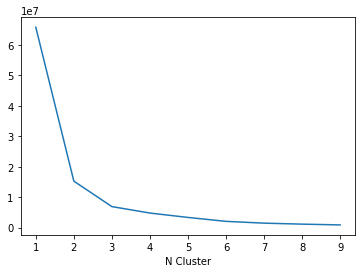

In [59]:
sse = {}
recency_df = rfm_df[["Recency"]]
for i in range(1,10):
    model = KMeans(n_clusters=i, max_iter=1000).fit(recency_df)
    recency_df["recency_c"] = model.labels_
    sse[i] = model.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("N Cluster")
plt.show()

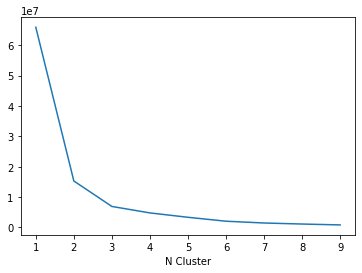

In [60]:
sse = {}
frequency_df = rfm_df[["Frequency"]]
for i in range(1,10):
    model = KMeans(n_clusters=i, max_iter=1000).fit(recency_df)
    frequency_df["frequency_c"] = model.labels_
    sse[i] = model.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("N Cluster")
plt.show()

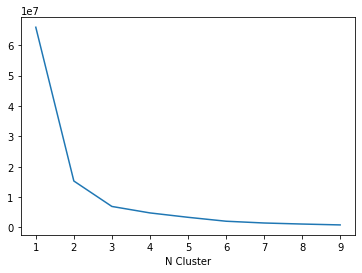

In [61]:
sse = {}
monetary_df = rfm_df[["Monetary"]]
for i in range(1,10):
    model = KMeans(n_clusters=i, max_iter=1000).fit(recency_df)
    monetary_df["monetary_c"] = model.labels_
    sse[i] = model.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("N Cluster")
plt.show()

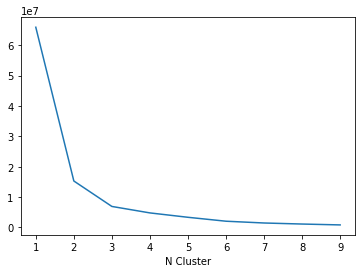

In [62]:
sse = {}
frequency_df = rfm_df[["Age(Days)"]]
for i in range(1,10):
    model = KMeans(n_clusters=i, max_iter=1000).fit(recency_df)
    frequency_df["age_c"] = model.labels_
    sse[i] = model.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("N Cluster")
plt.show()

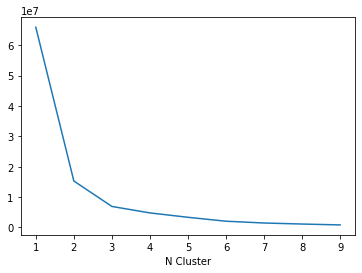

In [63]:
#rename column
rfm_df.rename({"avgDistance":"Return(Days)"},axis=1,inplace=True)

sse = {}
frequency_df = rfm_df[["Return(Days)"]]
for i in range(1,10):
    model = KMeans(n_clusters=i, max_iter=1000).fit(recency_df)
    frequency_df["return_c"] = model.labels_
    sse[i] = model.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("N Cluster")
plt.show()

In [64]:
rfm_df.head()

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days)
0,005h,387000.0,74.0,1,74.0,0.0
1,00dpl,340000.0,279.0,3,299.0,8.0
2,00h4a,150000.0,194.0,1,194.0,0.0
3,00kn,2108150.0,213.0,2,269.0,28.0
4,00r2,500000.0,217.0,1,217.0,0.0


In [65]:
!pip install squarify

### RFM quantile 

In [66]:
quantiles = rfm_df.quantile(q=[0.25,0.5,0.75])
quantiles

,Monetary,Recency,Frequency,Age(Days),Return(Days)
0.25,135000.0,106.0,1.0,169.0,0.0
0.50,295600.0,214.0,1.0,262.0,0.0
0.75,693575.0,286.0,2.0,302.0,0.0


In [67]:
quantiles.to_dict()

{'Monetary': {0.25: 135000.0, 0.5: 295600.0, 0.75: 693575.0},
 'Recency': {0.25: 106.0, 0.5: 214.0, 0.75: 286.0},
 'Frequency': {0.25: 1.0, 0.5: 1.0, 0.75: 2.0},
 'Age(Days)': {0.25: 169.0, 0.5: 262.0, 0.75: 302.0},
 'Return(Days)': {0.25: 0.0, 0.5: 0.0, 0.75: 0.0}}

In [68]:
# Arguments (x = value, p = recency, monetary_value, frequency, d = quartiles dict)
def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [69]:
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4

In [70]:
#create rfm segmentation table
rfm_segmentation = rfm_df
rfm_segmentation['R_Quartile'] = rfm_segmentation['Recency'].apply(RScore, args=('Recency',quantiles,))
rfm_segmentation['F_Quartile'] = rfm_segmentation['Frequency'].apply(FMScore, args=('Frequency',quantiles,))
rfm_segmentation['M_Quartile'] = rfm_segmentation['Monetary'].apply(FMScore, args=('Monetary',quantiles,))

In [71]:
rfm_segmentation.head()

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days),R_Quartile,F_Quartile,M_Quartile
0,005h,387000.0,74.0,1,74.0,0.0,4,1,3
1,00dpl,340000.0,279.0,3,299.0,8.0,2,4,3
2,00h4a,150000.0,194.0,1,194.0,0.0,3,1,2
3,00kn,2108150.0,213.0,2,269.0,28.0,3,3,4
4,00r2,500000.0,217.0,1,217.0,0.0,2,1,3


Text(0.5, 1.0, 'Number of Recency')

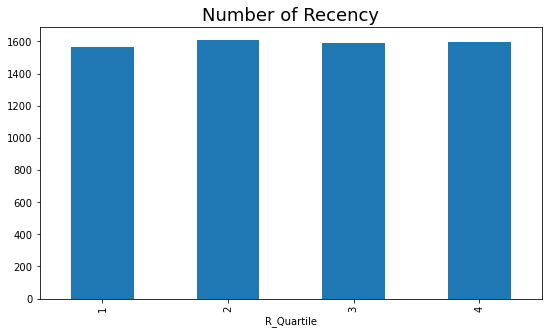

In [105]:
rfm_segmentation.groupby("R_Quartile",as_index=True)["ids"].nunique().plot(kind="bar",figsize=(9,5))
plt.title("Number of Recency",fontsize=18)

In [106]:
rfm_segmentation['R_Quartile'].value_counts()

2    1611
4    1596
3    1588
1    1564
Name: R_Quartile, dtype: int64

###### Recency 

Data ini merupakan histori transksi selama 2 tahun dan pada case ini kita bisa mengsegmentasikan customer terhadap nilai Recency menggunakan teknik Quantile dengan ketentuan berikut:



In [72]:
rfm_segmentation['RFMScore'] = rfm_segmentation.R_Quartile.map(str) \
                            + rfm_segmentation.F_Quartile.map(str) \
                            + rfm_segmentation.M_Quartile.map(str)
rfm_segmentation.head()

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days),R_Quartile,F_Quartile,M_Quartile,RFMScore
0,005h,387000.0,74.0,1,74.0,0.0,4,1,3,413
1,00dpl,340000.0,279.0,3,299.0,8.0,2,4,3,243
2,00h4a,150000.0,194.0,1,194.0,0.0,3,1,2,312
3,00kn,2108150.0,213.0,2,269.0,28.0,3,3,4,334
4,00r2,500000.0,217.0,1,217.0,0.0,2,1,3,213


Best Recency score = 4: most recently purchase. Best Frequency score = 4: most quantity purchase. Best Monetary score = 4: spent the most.

In [73]:
rfm_segmentation[rfm_segmentation['RFMScore']=='444'].sort_values('Monetary', ascending=False).head(10)

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days),R_Quartile,F_Quartile,M_Quartile,RFMScore
4073,mse0o,603244500.0,0.0,2465,334.0,0.0,4,4,4,444
2529,dwcf,18496860.0,16.0,37,280.0,5.0,4,4,4,444
2991,ggzs,18246600.0,79.0,3,113.0,17.0,4,4,4,444
5136,t0c2,18104820.0,50.0,7,330.0,24.0,4,4,4,444
2728,ezjv,17208150.0,79.0,8,323.0,32.0,4,4,4,444
1351,732f,16400430.0,2.0,15,316.0,19.0,4,4,4,444
1815,9ug3,13845900.0,23.0,21,328.0,14.0,4,4,4,444
5217,thtp,13210000.0,19.0,8,311.0,42.0,4,4,4,444
545,2ui0,13023000.0,27.0,5,92.0,4.0,4,4,4,444
5409,uged,11086610.0,9.0,11,325.0,32.5,4,4,4,444


In [109]:
rfm_segmentation['Total Score'] = rfm_segmentation['R_Quartile'] + rfm_segmentation['F_Quartile'] +rfm_segmentation['M_Quartile']
rfm_segmentation.head()

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days),R_Quartile,F_Quartile,M_Quartile,RFMScore,Label,Total Score
0,005h,387000.0,74.0,1,74.0,0.0,4,1,3,413,Others,8
1,00dpl,340000.0,279.0,3,299.0,8.0,2,4,3,243,Loyal Customers,9
2,00h4a,150000.0,194.0,1,194.0,0.0,3,1,2,312,Others,6
3,00kn,2108150.0,213.0,2,269.0,28.0,3,3,4,334,Big Spenders,10
4,00r2,500000.0,217.0,1,217.0,0.0,2,1,3,213,Others,6



    * If total_Score = 12, then "Excellent"
    * If 7 <= total_Score < 12, then "Good"
    * If 3 <= total_Score < 7, then "Bad"
    * If 1 <= total_Score < 3, then "Only 1 transaction?"


In [116]:
# Setting up the label for each client and adding the column "Label" to the dataframe

labels = [0] * len(rfm_segmentation)

for i in range(0,len(rfm_segmentation)):

    if rfm_segmentation['Total Score'][i] == 12:
        labels[i] = "Excellent"
        
    elif rfm_segmentation['Total Score'][i] >= 7 :
        labels[i] = "Good"
    
    elif rfm_segmentation['Total Score'][i] >= 5 :
        labels[i] = "Medium"
        
    elif rfm_segmentation['Total Score'][i] >= 3:
        labels[i] = "Bad"
        
    else:
        labels[i] = "Only 1 transaction?"

In [117]:
rfm_segmentation['Label2'] = labels

Text(0.5, 1.0, 'Total pelanggan berdasarkan nilai segmentasi pelanggan')

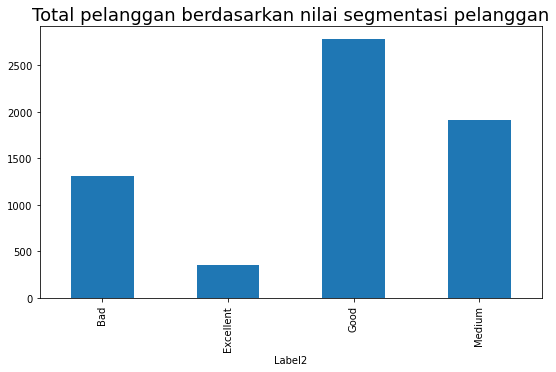

In [118]:
rfm_segmentation.groupby("Label2",as_index=True)["ids"].nunique().plot(kind="bar",figsize=(9,5))
plt.title("Total pelanggan berdasarkan nilai segmentasi pelanggan",fontsize=18)

In [119]:
rfm_segmentation['Label2'].value_counts()

Good         2780
Medium       1916
Bad          1308
Excellent     355
Name: Label2, dtype: int64

Chart di atas memberikan informasi total customer pada masing-masing segmen customer. Bisa dilihat bahwa 20.56% customer kita ada disegmen Bad customer. Namun sebanyak 43.71% customer berada disegment Good. 

In [120]:
print("Best Customers: ",len(rfm_segmentation[rfm_segmentation['RFMScore']=='444']))
print('Loyal Customers: ',len(rfm_segmentation[rfm_segmentation['F_Quartile']==4]))
print("Big Spenders: ",len(rfm_segmentation[rfm_segmentation['M_Quartile']==4]))
print('Almost Lost: ', len(rfm_segmentation[rfm_segmentation['RFMScore']=='244']))
print('Lost Customers: ',len(rfm_segmentation[rfm_segmentation['RFMScore']=='144']))
print('Lost Cheap Customers: ',len(rfm_segmentation[rfm_segmentation['RFMScore']=='111']))

Best Customers:  355
Loyal Customers:  1032
Big Spenders:  1590
Almost Lost:  109
Lost Customers:  63
Lost Cheap Customers:  527


In [121]:
# Setting up the label for each client and adding the column "Label" to the dataframe

label = [0] * len(rfm_segmentation)

for i in range(0,len(rfm_segmentation)):

    if rfm_segmentation['RFMScore'][i] == '444':
        label[i] = "Best Customers"
        
    elif rfm_segmentation['RFMScore'][i] == '244' :
        label[i] = "Almost Lost"
        
    elif rfm_segmentation['RFMScore'][i] == '144':
        label[i] = "Lost Customers"
    
    elif rfm_segmentation['RFMScore'][i] == '111':
        label[i] = "Lost Cheap Customers"

    elif rfm_segmentation['F_Quartile'][i] == 4:
        label[i] = "Loyal Customers"  
    
    elif rfm_segmentation['M_Quartile'][i] == 4:
        label[i] = "Big Spenders"   
        
    else:
        label[i] = "Others"

In [122]:
rfm_segmentation['RFMScore'].value_counts()



111    527
211    406
112    375
444    355
212    345
312    297
311    287
411    266
113    259
412    258
213    245
313    240
413    226
344    212
314    161
334    125
214    122
233    117
433    111
244    109
333    105
114    102
434     92
234     92
414     89
443     77
343     75
232     72
133     72
432     70
134     68
144     63
132     52
243     49
332     48
231     33
131     29
442     26
342     23
431     22
242     18
331     14
143     13
441      4
142      3
241      3
341      1
141      1
Name: RFMScore, dtype: int64

In [123]:
# Adding the 'Label' column to our dataframe

rfm_segmentation['Label'] = label

In [124]:
# Count the frequency that a value occurs in a dataframe column for the labels.

rfm_segmentation['Label'].value_counts()

Others                  3949
Big Spenders             851
Lost Cheap Customers     527
Loyal Customers          505
Best Customers           355
Almost Lost              109
Lost Customers            63
Name: Label, dtype: int64

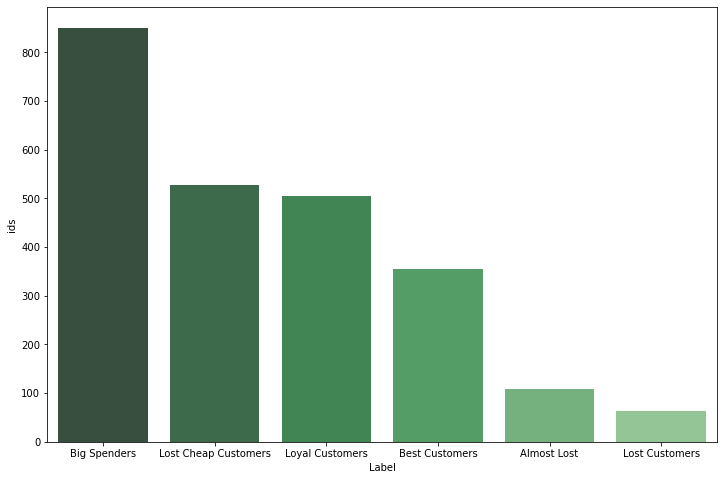

In [125]:
import seaborn as sns
sq1=rfm_segmentation.groupby('Label')['ids'].nunique().sort_values(ascending=False).reset_index()
plt.figure(figsize=(12,8))
sq1.drop([0],inplace=True)
sns.barplot(data=sq1, x="Label", y="ids", palette = "Greens_d", orient=True)

<function matplotlib.pyplot.show(*args, **kw)>

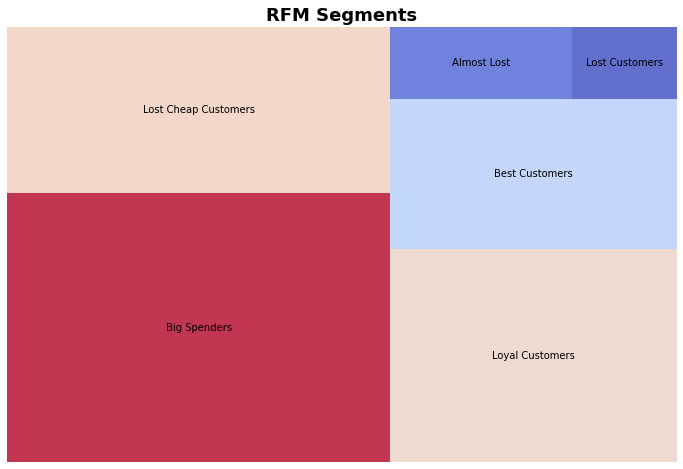

In [126]:
import squarify
import matplotlib
import matplotlib.pyplot as plt
cmap = matplotlib.cm.coolwarm
mini = min(sq1['ids'])
maxi = max(sq1['ids'])
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in sq1['ids']]
fig = plt.gcf()
ax= fig.add_subplot()
fig.set_size_inches(12,8)
squarify.plot(sizes=sq1['ids'], label=sq1.Label, alpha=0.8,color=colors)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show

In [103]:
rfm_segmentation.head()

,ids,Monetary,Recency,Frequency,Age(Days),Return(Days),R_Quartile,F_Quartile,M_Quartile,RFMScore,Label
0,005h,387000.0,74.0,1,74.0,0.0,4,1,3,413,Others
1,00dpl,340000.0,279.0,3,299.0,8.0,2,4,3,243,Loyal Customers
2,00h4a,150000.0,194.0,1,194.0,0.0,3,1,2,312,Others
3,00kn,2108150.0,213.0,2,269.0,28.0,3,3,4,334,Big Spenders
4,00r2,500000.0,217.0,1,217.0,0.0,2,1,3,213,Others


In [104]:
rfm_segmentation.to_csv('rfm-table-data.csv', sep=',')

 Kesimpulan :
 
Berdasarkan tahapan pengerjaan final project yang dilakukan, dapat diketahui hasil dari model RFM yakni atribut Recency, Frequency, dan Monetary dapat mendeskripsikan profil dan karakterisktik stiap segmen. Pengenalan segmentasi dapat dibuktikan dengan nilai Recency untuk mengetahui rentang waktu transaksi terakhir pelanggan, nilai Frequency untuk mengetahui jumlah transaksi yang dilakukan pelanggan, dan Monetary untuk mengetahui besaran rupiah yang dikeluarkan pelanggan pada data bursa sajadah yang ada dibeberapa cabang di Indonesia.


Dari pengolahan data bursa sajadah diperoleh :

    1. Terdapat 355 customer terbaik
        
    2. customer yang berpotensi untuk churn atau hilang/tidak menggunakan produk lagi ada 109 customer
    
    3. customer yang berpotensi untuk dikonversi menjadi pelanggan yang lebih menguntungkan ada 851 customers
    
    4. customer yang churn dan tidak perlu diberikan perhatian lebih ada 63 customers
    
    5. customer yang harus dipertahankan  sebanyak 521 
    
    6. customer yang loyal sebanyak 505
    
    7. Siapa customer yang berpotensi besar merespon campaign yang dilakukan?
    
    Tambahan ...

Saran :
